In [91]:
library(Seurat)
library(SeuratDisk)
library(glue)
library(dplyr)
library(ggplot2)
library(SummarizedExperiment)
library(limma)
library(muscat)
library(purrr)
library(scales)

In [92]:
figure.path <- "figures/"

### All celltypes

In [93]:
level <- 'cell_types_level_3'

In [ ]:
chl.single.cell <- LoadH5Seurat("data/combined_dataset_final_v2.h5seurat")
chl.single.cell

In [95]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_3 = 
         recode(cell_types_level_3,
                'B_cells' = 'B cells', 
                'Plasma_cells' = 'Plasma cells',
                'CD4_T_cells' = 'CD4+ T cells',
                'CD8_T_cells' = 'CD8+ T cells',
                'T_other' = 'CD4-/CD8- T cells',
                'NK_cells' = 'NK cells'
               ))

In [96]:
colors <- c(
    '#C83658FF','#FF7F0EFF','#AEC7E8FF','#96613DFF','#98DF8AFF',
    '#DDADADFF','#F8766DFF','#79AEA3FF','#2CA02CFF','#00BFC4FF',
    '#0088C5FF','#7CAE00FF','#9240C7FF','#7177E8FF','#7F7F7FFF'
)
names(colors) <- unique(chl.single.cell[[level]])[[level]]

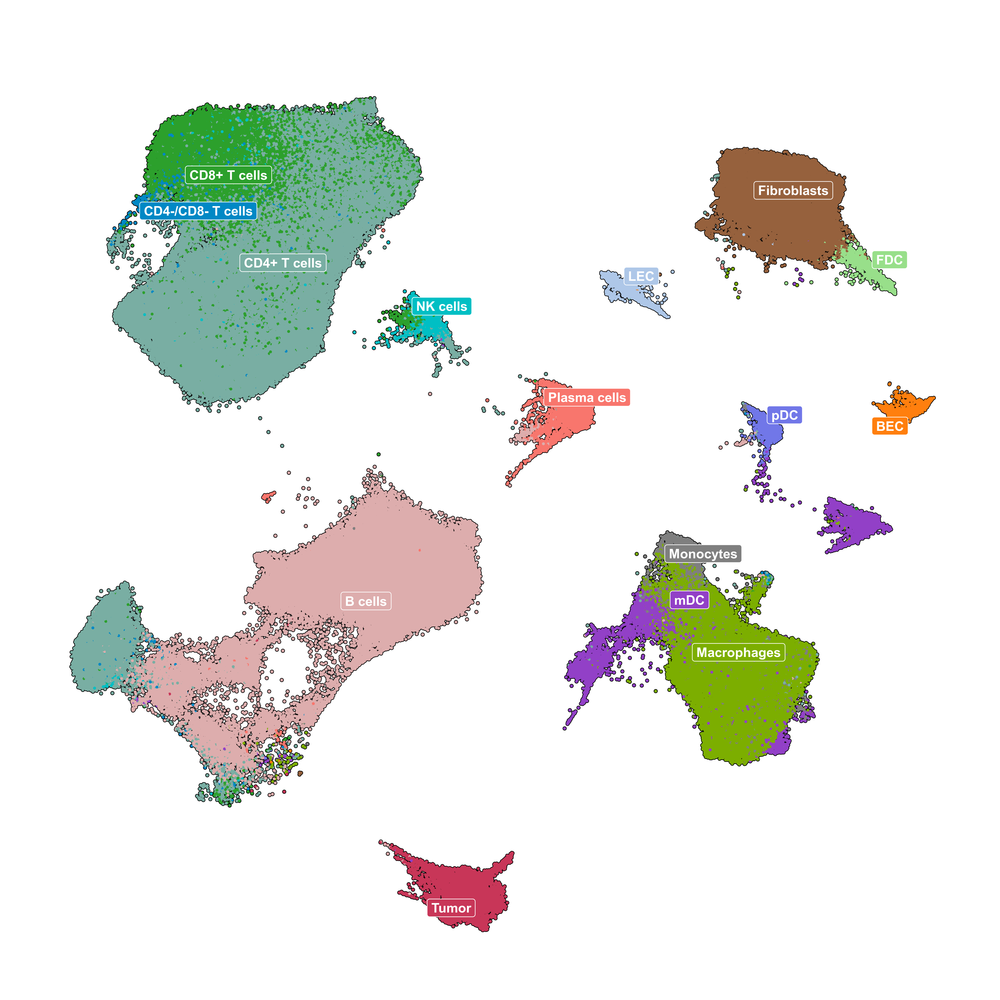

In [97]:
options(repr.plot.width=12, repr.plot.height=12, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, font.size=18,
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1 

In [98]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = "all_cells_level3_umap", 
    width = 12, 
    height = 12, 
    output_format="all"
)

In [99]:
markers <- c(
    'PTPRC','MS4A1','PAX5','XBP1','SDC1','CD3E','CD3D','CD3G','CD4','CD8A','NCAM1','IL3RA','CD1C',
    'FCER1A','CLEC10A','CD68','FSCN1','LYZ','C1QA','S100A8','PROX1','VWF','CCL19','COL1A1','CR1',
    'CR2','CXCL14','TNFRSF8','CD274'
)

In [100]:
Idents(chl.single.cell) <- 'cell_types_level_3'
levels(chl.single.cell) <- rev(c(
    'B cells','Plasma cells','CD4+ T cells','CD8+ T cells','CD4-/CD8- T cells',
    'NK cells','pDC','mDC','Macrophages','Monocytes','LEC','BEC','Fibroblasts','FDC','Tumor'
))

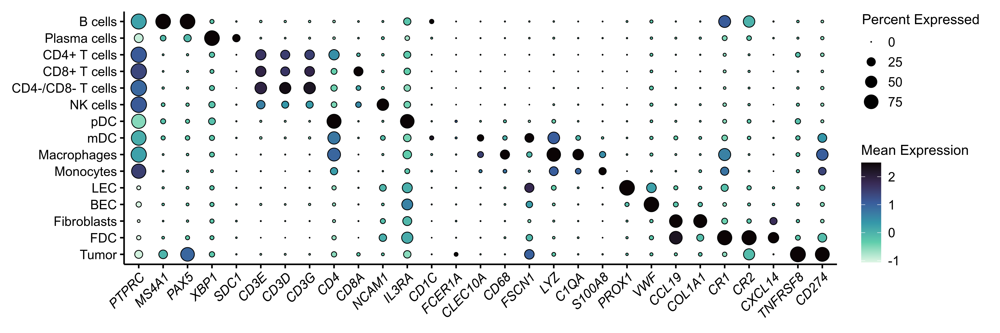

In [101]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [103]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("all_{level}_markergenes"), 
    width = 12, 
    height = 4, 
    output_format="all"
)

### B Cells

In [104]:
level <- 'cell_types_level_4'
ctype <- 'B_cells'

In [ ]:
chl.single.cell <- LoadH5Seurat(glue("data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

In [106]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'B_GC_cycling' = 'Cycling GC B cells', 
                'B_memory' = 'Memory B cells',
                'Plasma_cells' = 'Plasma cells',
                'B_naive' = 'Naive B cells',
                'B_GC' = 'GC B cells'
               ))

In [107]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF')
names(colors) <- unique(chl.single.cell[[level]])[[level]]

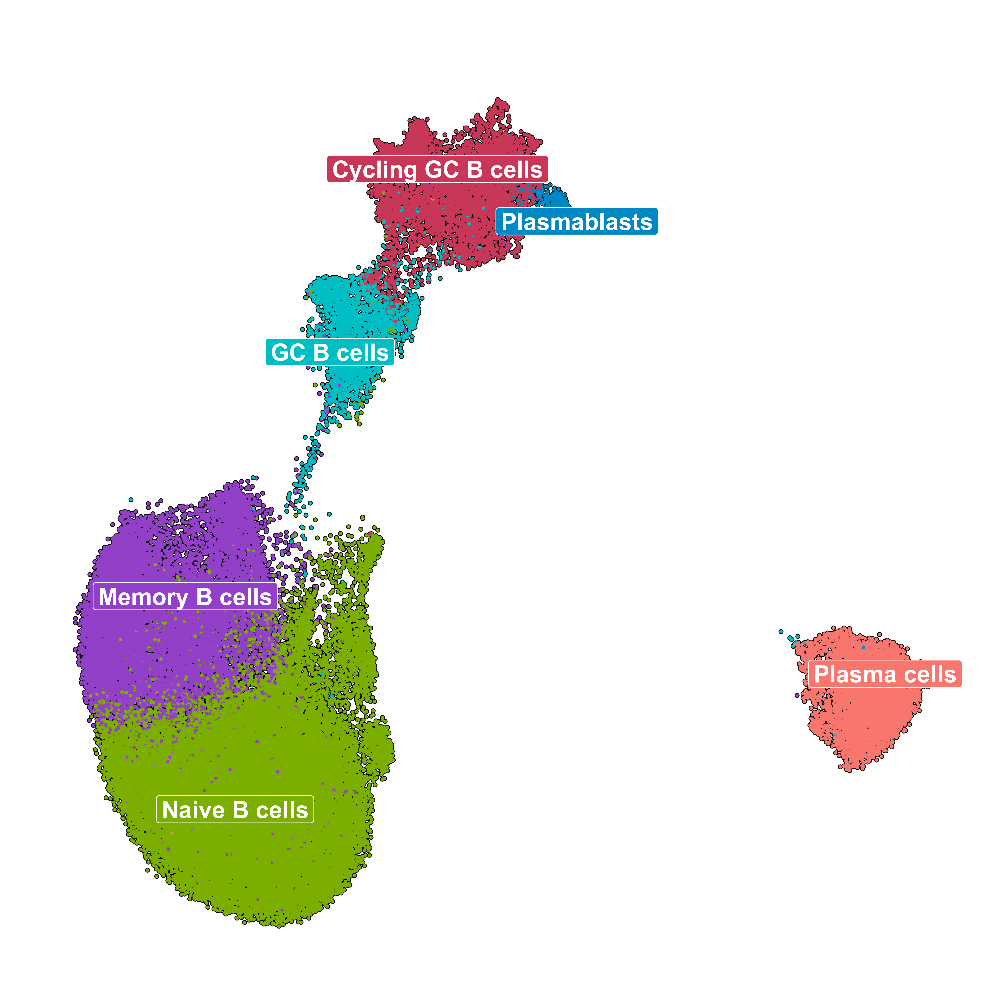

In [108]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [109]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [110]:
markers <- c('CD19','MS4A1','CD79A ','CD27','IGHM','IGHD','TCL1A','MME','BCL6','BCL2','MKI67','TNFRSF13B','XBP1','SDC1','CD38')

In [111]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Naive B cells','GC B cells','Cycling GC B cells','Memory B cells','Plasmablasts','Plasma cells'
))

Warning message:
“The requested features (CD79A ) could not be found:
    - Not matching any gene name (rownames of the provided object).
    - Not matching any metadata column (in sample@meta.data).
    - Not part of the dimension names in any of the following reductions: harmony, pca, umap.

”


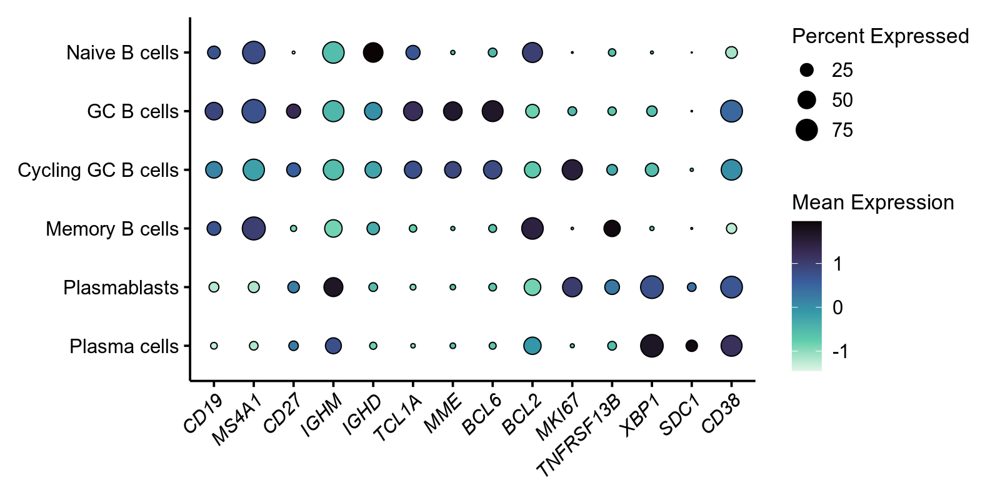

In [114]:
options(repr.plot.width=8, repr.plot.height=4, repr.plot.res=200)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [115]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"), 
    width = 8, 
    height = 4, 
    output_format="all"
)

### T Cells

In [116]:
level <- 'cell_types_level_4'
ctype <- 'T_cells'

In [ ]:
chl.single.cell <- LoadH5Seurat(glue("data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

In [118]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'CD4_T_naive' = 'Naive CD4+ T cells', 
                'Regulatory_T_cells' = 'Regulatory T cells',
                'Follicular_helper_T_cells' = 'Follicular helper T cells',
                'CD8_T_naive' = 'Naive CD8+ T cells',
                'CD8_T_effector' = 'Effector CD8+ T cells',
                'MAIT_cells' = 'MAIT cells',
                'DN_cytotoxic_T_cells' = 'CD4-/CD8- cytotoxic T cells',
                'NK_cells' = 'NK cells',
                'T_cycling' = 'Cycling T cells'
               ))

In [119]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF', 
            '#7F7F7FFF','#79AEA3FF','#DDADADFF','#98DF8AFF')

names(colors) <- unique(chl.single.cell[[level]])[[level]]

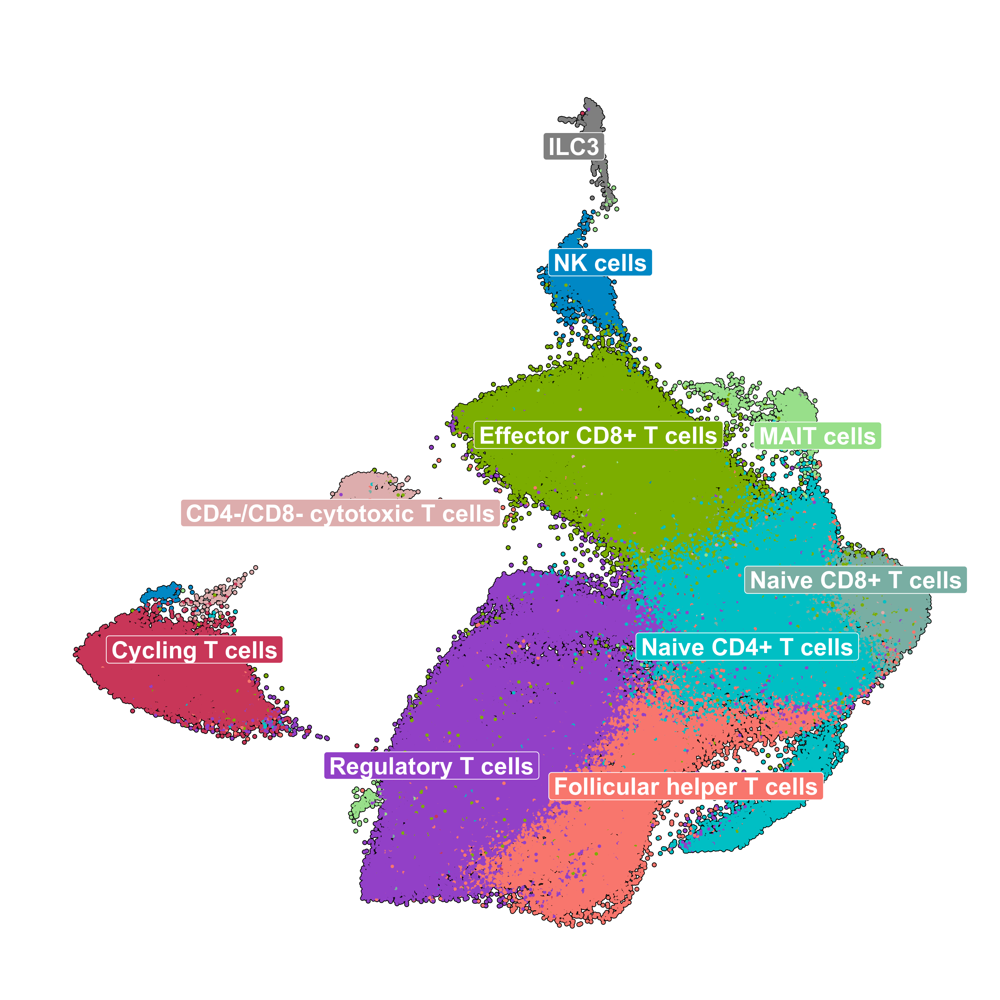

In [120]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [121]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [122]:
markers <- c(
    'CD3D','CD3E','CD3G','CD4','CD8A','CD8B','SELL','CCR7','FOXP3','TOX','TOX2','LAG3','PDCD1','CTLA4',
    'BCL6','GZMB','GZMH','GNLY','PRF1','GZMK','SLC4A10','TRAV1-2','PCDH9','NCAM1','KIT','LST1','MKI67'
)

In [123]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Naive CD4+ T cells','Regulatory T cells','Follicular helper T cells','Naive CD8+ T cells',
    'Effector CD8+ T cells','MAIT cells','CD4-/CD8- cytotoxic T cells','ILC3','NK cells','Cycling T cells'
))

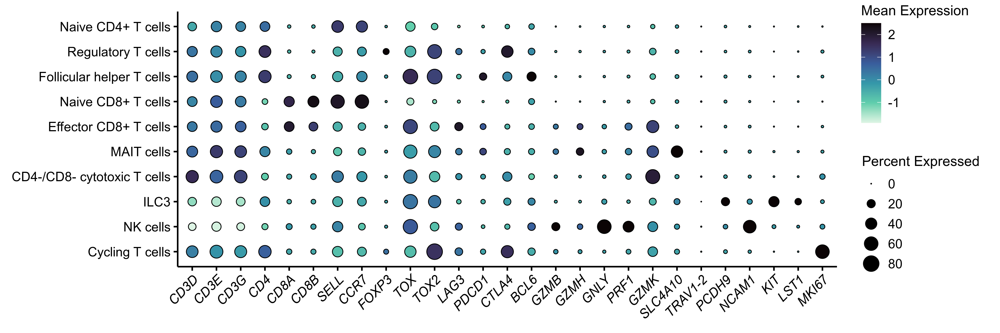

In [124]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [125]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"), 
    width = 12, 
    height = 4, 
    output_format="all"
)

### Stromal Cells

In [126]:
level <- 'cell_types_level_4'
ctype <- 'stromal'

In [ ]:
chl.single.cell <- LoadH5Seurat(glue("data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

In [128]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'FRC' = 'Fibroblastic reticular cells', 
                'LEC_cycling' = 'Cycling LECs',
                'LEC' = 'Lymphatic endothelial cells',
                'FRC_cycling' = 'Cycling FRCs',
                'BEC_arterial' = 'Blood endothelial cells - arterial',
                'BEC_venous' = 'Blood endothelial cells - venous',
                'FDC' = 'Follicular dendritic cells',
                'Pericyte' = 'Pericytes'
               ))

In [129]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF', 
            '#7F7F7FFF','#79AEA3FF','#DDADADFF','#98DF8AFF')

names(colors) <- unique(chl.single.cell[[level]])[[level]]

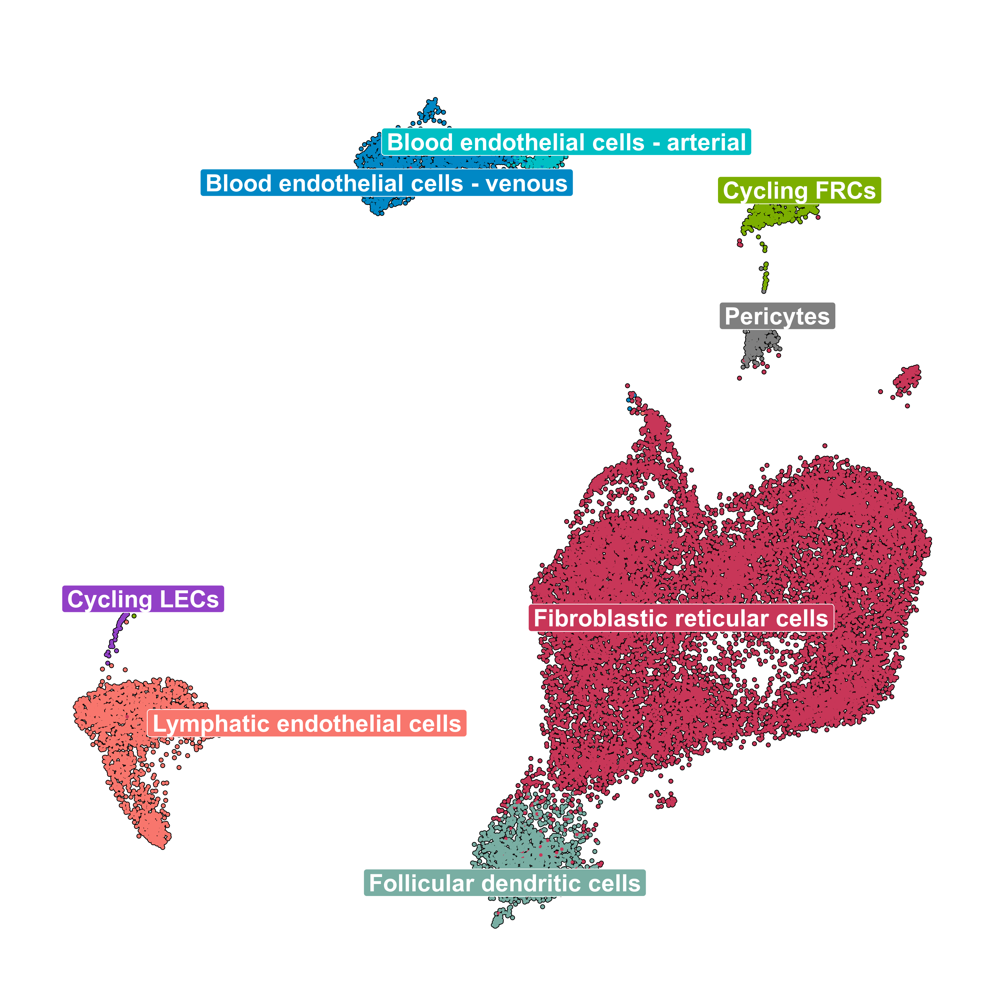

In [130]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [131]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [132]:
markers <- c(
    'CCL19','COL1A1','COL1A2','COL3A1','DCN','ACTA2','TNFSF13B','CR1','CR2','FDCSP','CXCL13',
    'PROX1','VWF','ACKR1','GJA5','HIGD1B','NDUFA4L2','MKI67'
)

In [133]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Fibroblastic reticular cells', 'Follicular dendritic cells', 'Cycling FRCs', 'Lymphatic endothelial cells',
    'Cycling LECs','Blood endothelial cells - venous', 'Blood endothelial cells - arterial', 'Pericytes'
))

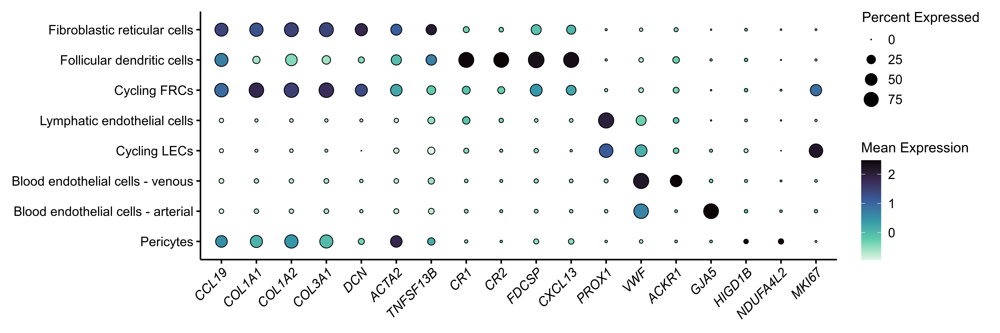

In [134]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [135]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"), 
    width = 12, 
    height = 4, 
    output_format="all"
)

### Myeloid Cells

In [136]:
level <- 'cell_types_level_4'
ctype <- 'myeloid_cells'

In [ ]:
chl.single.cell <- LoadH5Seurat(glue("data/combined_{ctype}_fine.h5seurat"))
chl.single.cell

In [138]:
chl.single.cell@meta.data <- chl.single.cell@meta.data %>%
  mutate(cell_types_level_4 = 
         recode(cell_types_level_4,
                'DC_cycling' = 'Cycling DCs', 
                'migratory_DC' = 'Migratory DCs',
                'pDC' = 'Plasmacytoid dendritic cells'
               ))

In [139]:
colors <- c('#C83658FF','#9240C7FF','#F8766DFF','#7CAE00FF','#00BFC4FF','#0088C5FF', 
            '#7F7F7FFF','#79AEA3FF','#DDADADFF','#98DF8AFF')

names(colors) <- unique(chl.single.cell[[level]])[[level]]

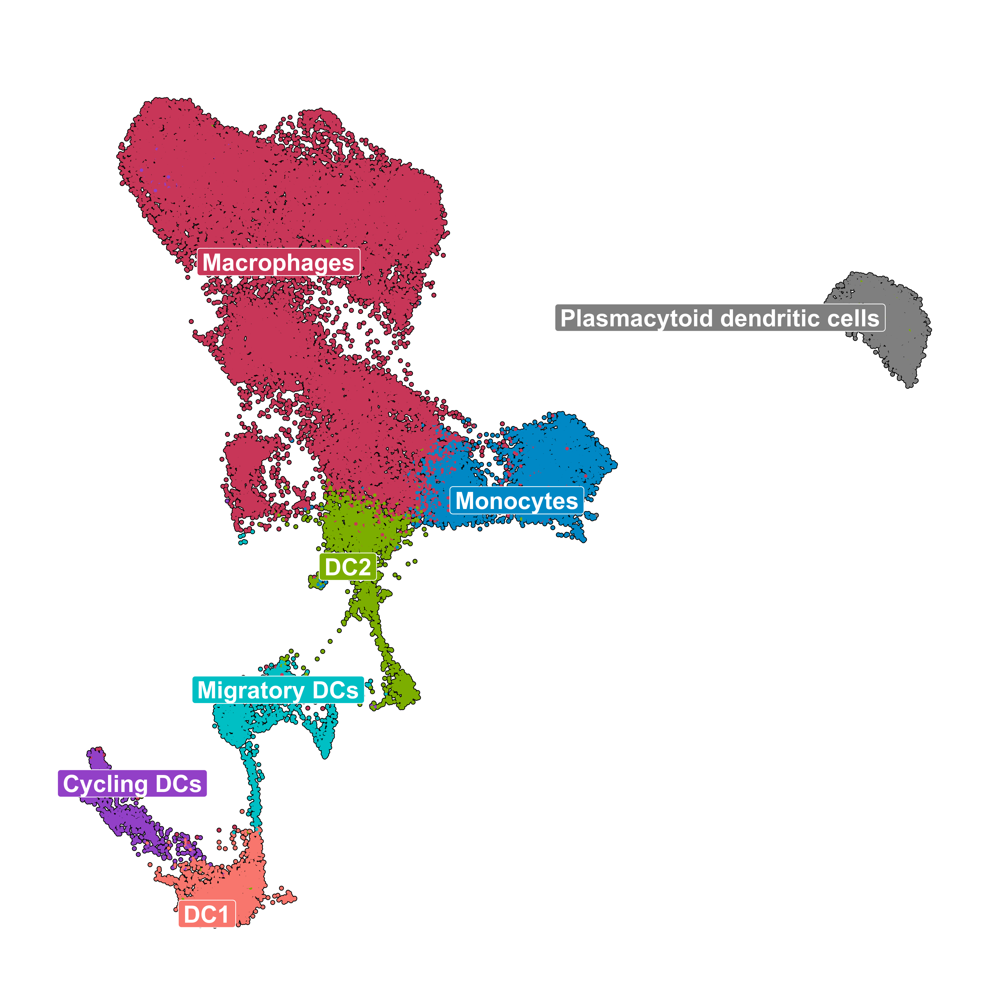

In [140]:
options(repr.plot.width=10, repr.plot.height=10, repr.plot.res=300)
p1 <- SCpubr::do_DimPlot(
    sample=chl.single.cell, 
    group.by=level, 
    colors.use=colors, 
    pt.size=.5, 
    label=TRUE, shuffle=TRUE 
) + NoLegend()
p1$layers[[length(p1$layers)]]$aes_params$size <- 6
p1 

In [141]:
SCpubr::save_Plot(
    plot = p1, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_umap"), 
    width = 10, 
    height = 10, 
    output_format="all"
)

In [142]:
markers <- c(
    'CD74','HLADRA','LYZ','CD68','C1QA','C1QB','CD68','S100A8','S100A9','CD14','FCGR3A','CLEC9A','IDO1',
    'XCR1','CLEC10A','CD1C','PKIB','FSCN1','LAMP3','CCR7','IL3RA','LILRA4','PLD4','MKI67'
)

In [143]:
Idents(chl.single.cell) <- 'cell_types_level_4'
levels(chl.single.cell) <- rev(c(
    'Macrophages','Monocytes','DC1','DC2','Migratory DCs','Plasmacytoid dendritic cells','Cycling DCs'
))

Warning message:
“The requested features (HLADRA) could not be found:
    - Not matching any gene name (rownames of the provided object).
    - Not matching any metadata column (in sample@meta.data).
    - Not part of the dimension names in any of the following reductions: harmony, pca, umap.

”
Warning message:
“Found duplicated features (CD68). Excluding them from the analysis.”


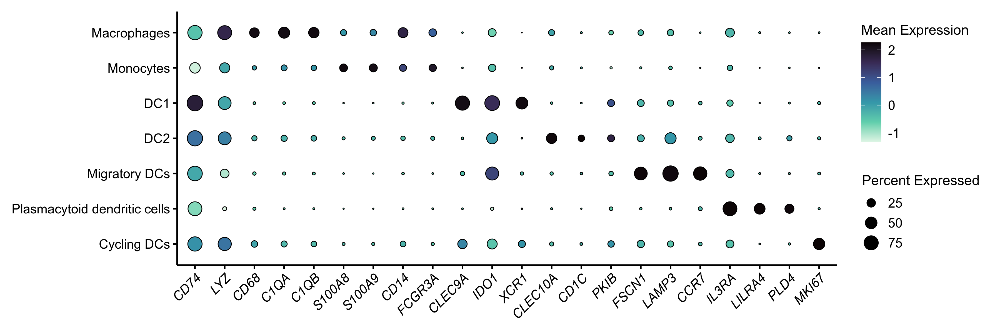

In [144]:
options(repr.plot.width=12, repr.plot.height=4, repr.plot.res=300)
p <- SCpubr::do_DotPlot(
    sample = chl.single.cell, 
    features = markers,
    legend.position='right',
    legend.type='normal',
    # rotate_x_axis_labels = 90,
    use_viridis=TRUE
) + theme(axis.text.x=element_text(face = "italic"), 
          axis.text.y=element_text(face = "plain"),
          legend.text=element_text(face = "plain"),
          legend.title=element_text(face = "plain", size=12)) + 
    ggplot2::guides(fill = ggplot2::guide_colorbar(title = 'Mean Expression'))
p

In [145]:
SCpubr::save_Plot(
    plot = p, 
    figure_path = figure.path, 
    file_name = glue("{ctype}_{level}_markergenes"),
    width = 12, 
    height = 4, 
    output_format="all"
)

In [135]:
sessionInfo()

R version 4.1.2 (2021-11-01)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Debian GNU/Linux 11 (bullseye)

Matrix products: default
BLAS/LAPACK: /home/dchafamo/anaconda3/envs/seurat_imaging/lib/libopenblasp-r0.3.20.so

locale:
 [1] LC_CTYPE=C.UTF-8       LC_NUMERIC=C           LC_TIME=C.UTF-8       
 [4] LC_COLLATE=C.UTF-8     LC_MONETARY=C.UTF-8    LC_MESSAGES=C.UTF-8   
 [7] LC_PAPER=C.UTF-8       LC_NAME=C              LC_ADDRESS=C          
[10] LC_TELEPHONE=C         LC_MEASUREMENT=C.UTF-8 LC_IDENTIFICATION=C   

attached base packages:
[1] stats4    stats     graphics  grDevices utils     datasets  methods  
[8] base     

other attached packages:
 [1] scales_1.2.1                purrr_0.3.5                
 [3] muscat_1.8.2                limma_3.50.3               
 [5] SummarizedExperiment_1.24.0 Biobase_2.54.0             
 [7] GenomicRanges_1.46.1        GenomeInfoDb_1.30.1        
 [9] IRanges_2.28.0              S4Vectors_0.32.4           
[11] BiocGenerics_0.40